# Train DeepBreach
This is an experiment in three parts, first a model will be trained on single channel images with maximum downslope from a DEM, next a model will be trained on RGB imagery from arial photograhy. The third experiment will be a combination of both the RGB images and the downslope index.

Common callback functions

In [1]:
import sys
sys.path.insert(1, '/workspace/code/model/')
import tensorflow as tf

reduce_lr= tf.keras.callbacks.ReduceLROnPlateau(
    monitor="val_loss",
    patience=10,
    verbose=1,
    mode="min",
    min_lr=0.0001)

2024-05-02 12:52:10.051549: I tensorflow/core/util/port.cc:113] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-05-02 12:52:10.102037: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F AVX512_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


# Downslope

In [2]:
from data_generator import create_train_generator_single_channel, create_test_generator_single_channel

image_dir = '/workspace/trainingData/rgb_downslope_256/training/images'
mask_dir = '/workspace/trainingData/rgb_downslope_256/training/labels'


training_generator_single_channel = create_train_generator_single_channel(image_dir, mask_dir)
# test generetor

test_image_dir = '/workspace/trainingData/rgb_downslope_256/testing/images'
test_mask_dir = '/workspace/trainingData/rgb_downslope_256/testing/labels'

testing_generator_single_channel = create_test_generator_single_channel(test_image_dir, test_mask_dir)

Found 23122 images belonging to 1 classes.
Found 23122 images belonging to 1 classes.
Found 5251 images belonging to 1 classes.
Found 5251 images belonging to 1 classes.


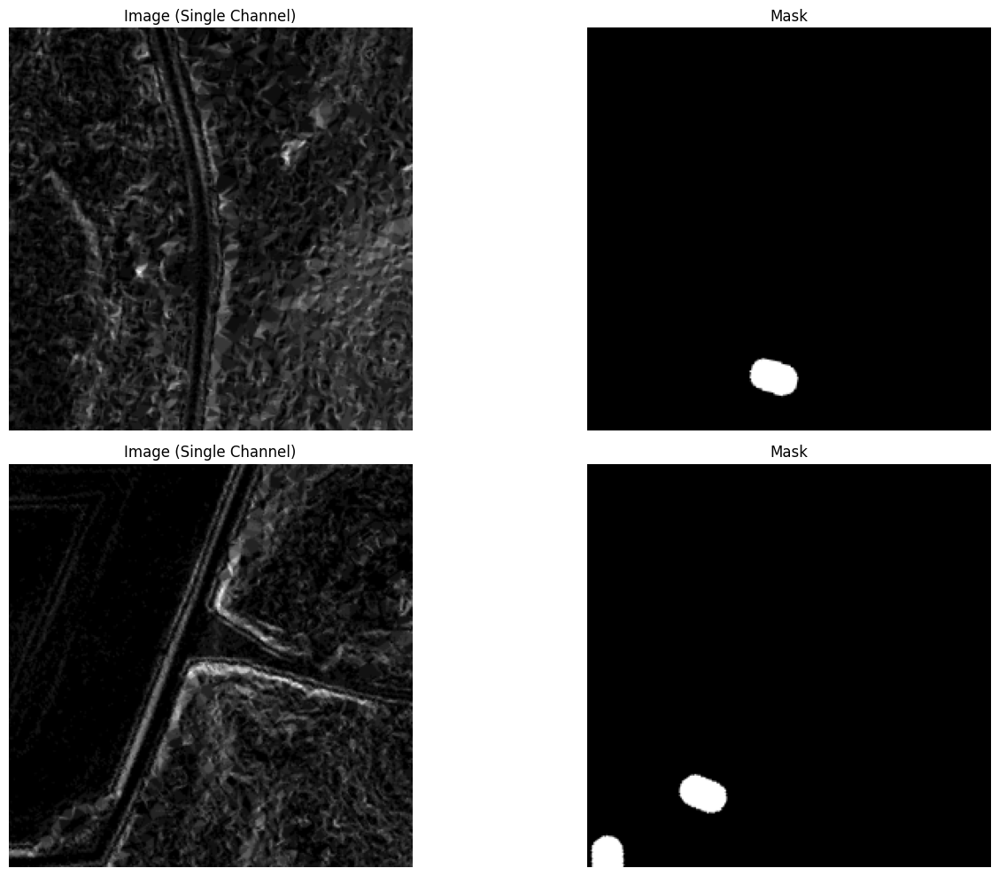

In [3]:
import matplotlib.pyplot as plt

def plot_samples_single_channel(generator, num_samples=2):
    # Set up a figure with appropriate size
    plt.figure(figsize=(15, 10))

    # Iterate over the generator to get samples
    for i, (image, mask) in enumerate(generator):
        if i == num_samples:
            break

        # Plot the image
        plt.subplot(num_samples, 2, 2*i + 1)
        plt.imshow(image[0, :, :, 0], cmap='gray')  # Assuming batch size is 1, so accessing first image
        plt.title('Image (Single Channel)')
        plt.axis('off')

        # Plot the mask
        plt.subplot(num_samples, 2, 2*i + 2)
        plt.imshow(mask[0, :, :, 0], cmap='gray')  # Assuming batch size is 1, so accessing first mask
        plt.title('Mask')
        plt.axis('off')

    plt.tight_layout()
    plt.show()

plot_samples_single_channel(training_generator_single_channel, num_samples=2)

## Train a standard UNEt

In [4]:
%%time
import sys
sys.path.insert(1, '/workspace/code/saved_models/')

from unets import UNet
from metrics import f1_score, MCC, precision_m, recall_m

BATCH_SIZE = 32
IMG_HEIGHT = 256
IMG_WIDTH = 256
IMG_CHANNELS = 1
NUM_CLASSES = 1 

steps = 23122 //BATCH_SIZE # number of training images / batch size
steps_eval = 5251 //BATCH_SIZE # number of testing images / batch size

UNet_model_single = UNet(IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS, NUM_CLASSES)

UNet_model_single.compile(tf.keras.optimizers.Adam(learning_rate=0.001), 
    loss=tf.keras.losses.BinaryFocalCrossentropy(
    apply_class_balancing=True,
    alpha=0.97,
    gamma=2.0,
    from_logits=True),
    metrics=[f1_score, MCC, precision_m, recall_m])

checkpoint_filepath = '/workspace/code/saved_models/UNet_single_bs32_epoch100.weights.h5'
model_checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
    filepath=checkpoint_filepath,
    save_weights_only=True,
    monitor='val_loss',
    mode='min',
    save_best_only=True)


result_single_channel = UNet_model_single.fit(training_generator_single_channel, epochs=100, validation_data = testing_generator_single_channel, validation_steps = steps_eval, steps_per_epoch = steps, callbacks = [model_checkpoint_callback, reduce_lr])

2024-05-02 12:52:15.481527: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1928] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 38435 MB memory:  -> device: 0, name: NVIDIA A100 80GB PCIe MIG 3g.40gb, pci bus id: 0000:17:00.0, compute capability: 8.0


Epoch 1/100


I0000 00:00:1714654340.384903    1275 service.cc:145] XLA service 0x7f0d000025d0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1714654340.384937    1275 service.cc:153]   StreamExecutor device (0): NVIDIA A100 80GB PCIe MIG 3g.40gb, Compute Capability 8.0
2024-05-02 12:52:20.540999: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2024-05-02 12:52:21.171674: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:465] Loaded cuDNN version 8906


  1/722 ━━━━━━━━━━━━━━━━━━━━ 10:31:00 53s/step - f1_score: 0.0871 - loss: 0.0067 - mcc: 0.1878 - precision_m: 0.7419 - recall_m: 0.0463

I0000 00:00:1714654388.871422    1275 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


722/722 ━━━━━━━━━━━━━━━━━━━━ 450s 551ms/step - f1_score: 0.1006 - loss: 0.0040 - mcc: 0.1232 - precision_m: 0.2376 - recall_m: 0.1023 - val_f1_score: 0.3113 - val_loss: 0.0024 - val_mcc: 0.3143 - val_precision_m: 0.3862 - val_recall_m: 0.2708 - learning_rate: 0.0010
Epoch 2/100
722/722 ━━━━━━━━━━━━━━━━━━━━ 366s 507ms/step - f1_score: 0.2578 - loss: 0.0028 - mcc: 0.2758 - precision_m: 0.2490 - recall_m: 0.3587 - val_f1_score: 0.3905 - val_loss: 0.0022 - val_mcc: 0.3875 - val_precision_m: 0.4168 - val_recall_m: 0.3742 - learning_rate: 0.0010
Epoch 3/100
722/722 ━━━━━━━━━━━━━━━━━━━━ 323s 448ms/step - f1_score: 0.3169 - loss: 0.0025 - mcc: 0.3348 - precision_m: 0.2852 - recall_m: 0.4315 - val_f1_score: 0.4334 - val_loss: 0.0020 - val_mcc: 0.4301 - val_precision_m: 0.4216 - val_recall_m: 0.4548 - learning_rate: 0.0010
Epoch 4/100
722/722 ━━━━━━━━━━━━━━━━━━━━ 365s 506ms/step - f1_score: 5.9105e-04 - loss: 0.0055 - mcc: 2.2873e-04 - precision_m: 9.8641e-04 - recall_m: 5.7443e-04 - val_f1_scor

In [16]:
checkpoint_filepath = '/workspace/code/saved_models/UNet_single_bs32_epoch100.weights.h5'
UNet_model_single.load_weights(checkpoint_filepath)
UNet_model_single.evaluate(testing_generator_single_channel, steps=steps_eval, batch_size=BATCH_SIZE)

164/164 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - f1_score: 0.5539 - loss: 0.0014 - mcc: 0.5539 - precision_m: 0.5001 - recall_m: 0.6266


[0.0013948979321867228,
 0.5566487312316895,
 0.5567609071731567,
 0.5024192333221436,
 0.6299623847007751]

## Train the attention resunet

In [88]:
%%time
import sys
sys.path.insert(1, '/workspace/code/saved_models/')

from unets import Attention_ResUNet
from metrics import f1_score, MCC, precision_m, recall_m

BATCH_SIZE = 32
IMG_HEIGHT = 256
IMG_WIDTH = 256
IMG_CHANNELS = 1
NUM_CLASSES = 1 

steps = 23122 //BATCH_SIZE # number of training images / batch size
steps_eval = 5251 //BATCH_SIZE # number of testing images / batch size

model_single = Attention_ResUNet(IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS, NUM_CLASSES)

model_single.compile(tf.keras.optimizers.Adam(learning_rate=0.001), 
    loss=tf.keras.losses.BinaryFocalCrossentropy(
    apply_class_balancing=True,
    alpha=0.97,
    gamma=2.0,
    from_logits=True),
    metrics=[f1_score, MCC, precision_m, recall_m])

checkpoint_filepath = '/workspace/code/saved_models/Attention_ResUNet_single_bs32_epoch100.weights.h5'
model_checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
    filepath=checkpoint_filepath,
    save_weights_only=True,
    monitor='val_loss',
    mode='min',
    save_best_only=True)


result_single_channel = model_single.fit(training_generator_single_channel, epochs=100, validation_data = testing_generator_single_channel, validation_steps = steps_eval, steps_per_epoch = steps, callbacks = [model_checkpoint_callback, reduce_lr])

Epoch 1/100
722/722 ━━━━━━━━━━━━━━━━━━━━ 544s 665ms/step - f1_score: 0.1490 - loss: 0.0106 - mcc: 0.2260 - precision_m: 0.0842 - recall_m: 0.7177 - val_f1_score: 0.2116 - val_loss: 0.0090 - val_mcc: 0.2900 - val_precision_m: 0.1235 - val_recall_m: 0.7500 - learning_rate: 0.0010
Epoch 2/100
722/722 ━━━━━━━━━━━━━━━━━━━━ 426s 590ms/step - f1_score: 0.2371 - loss: 0.0086 - mcc: 0.2975 - precision_m: 0.1451 - recall_m: 0.6638 - val_f1_score: 0.3216 - val_loss: 0.0077 - val_mcc: 0.3512 - val_precision_m: 0.2231 - val_recall_m: 0.5862 - learning_rate: 0.0010
Epoch 3/100
722/722 ━━━━━━━━━━━━━━━━━━━━ 423s 585ms/step - f1_score: 0.2765 - loss: 0.0076 - mcc: 0.3236 - precision_m: 0.1785 - recall_m: 0.6286 - val_f1_score: 0.3886 - val_loss: 0.0070 - val_mcc: 0.3904 - val_precision_m: 0.3289 - val_recall_m: 0.4832 - learning_rate: 0.0010
Epoch 4/100
722/722 ━━━━━━━━━━━━━━━━━━━━ 423s 585ms/step - f1_score: 0.3157 - loss: 0.0071 - mcc: 0.3506 - precision_m: 0.2154 - recall_m: 0.6015 - val_f1_score: 0

## Test the model

In [14]:
model_single.load_weights(checkpoint_filepath)
model_single.evaluate(testing_generator_single_channel, steps=steps_eval, batch_size=BATCH_SIZE)

164/164 ━━━━━━━━━━━━━━━━━━━━ 31s 166ms/step - f1_score: 0.5289 - loss: 0.0058 - mcc: 0.5542 - precision_m: 0.4009 - recall_m: 0.7843


[0.005802548956125975,
 0.5304215550422668,
 0.5554177165031433,
 0.4024989902973175,
 0.7842352986335754]

## Predict

1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step


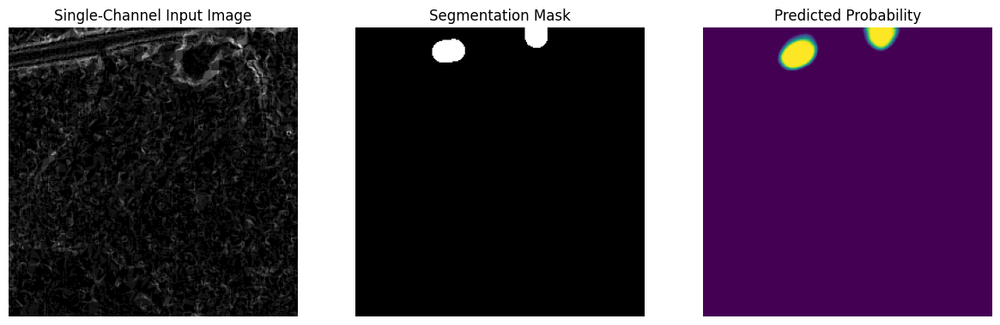

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


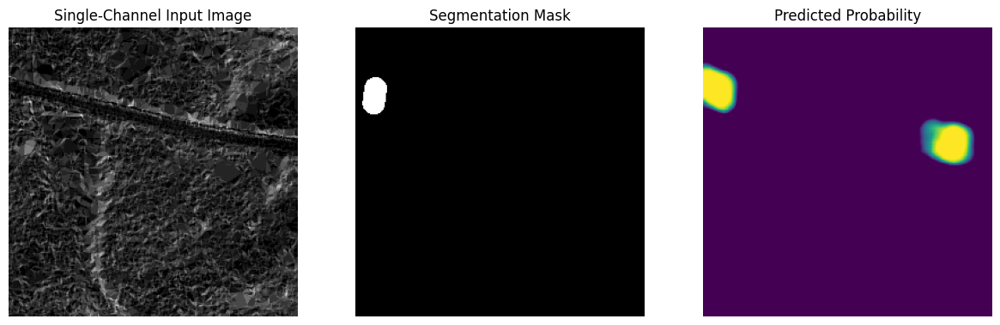

In [17]:
import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf

# Assuming `testing_generator_single_channel` generates single-channel images

test_batch = next(testing_generator_single_channel)

images, labels = test_batch
num_images_to_plot = 2

for i in range(min(num_images_to_plot, images.shape[0])):
    plt.figure(figsize=(20, 8))

    # Plot the single-channel input image
    plt.subplot(1, 4, 1)
    plt.imshow(images[i, :, :, 0], cmap='gray')  # Assuming batch size is 1
    plt.title('Single-Channel Input Image')
    plt.axis('off')

    # Plot the segmentation mask
    plt.subplot(1, 4, 2)
    plt.imshow(labels[i, :, :, 0], cmap='gray')  # Assuming batch size is 1
    plt.title('Segmentation Mask')
    plt.axis('off')

    # Run prediction
    input_array = tf.image.resize(images[i], [IMG_HEIGHT, IMG_WIDTH])
    input_array = tf.expand_dims(input_array, axis=0)  # Add batch dimension
    predictions = model_single.predict(input_array)

    # Calculate probability map from predictions
    probability_map = predictions[0, :, :, 0]

    # Apply threshold of 0.5
    thresholded_map = np.where(probability_map > 0.5, 1, 0)

    # Plot the thresholded probability map
    # plt.subplot(1, 4, 3)
    # plt.imshow(thresholded_map, cmap='gray')
    # plt.title('Thresholded Map (>=0.5)')
    # plt.axis('off')

    # Plot the predicted result
    plt.subplot(1, 4, 3)
    plt.imshow(predictions[0, :, :, 0], cmap='viridis')
    plt.title('Predicted Probability')
    plt.axis('off')

    plt.show()


# RGB

In [18]:
import sys
sys.path.insert(1, '/workspace/code/model/')
from data_generator import create_train_generator_RGB, create_test_generator_RGB

image_dir = '/workspace/trainingData/rgb_downslope_256/training/images'
mask_dir = '/workspace/trainingData/rgb_downslope_256/training/labels'


training_generator_RGB = create_train_generator_RGB(image_dir, mask_dir)
# test generetor

test_image_dir = '/workspace/trainingData/rgb_downslope_256/testing/images'
test_mask_dir = '/workspace/trainingData/rgb_downslope_256/testing/labels'

testing_generator_RGB = create_test_generator_RGB(test_image_dir, test_mask_dir)

Found 23122 images belonging to 1 classes.
Found 23122 images belonging to 1 classes.
Found 5251 images belonging to 1 classes.
Found 5251 images belonging to 1 classes.


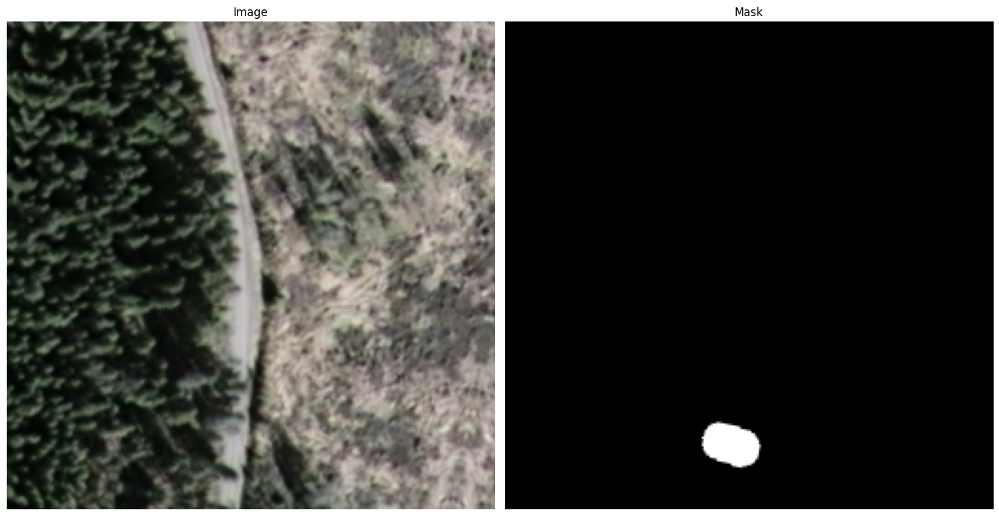

In [19]:
import matplotlib.pyplot as plt

def plot_samples(generator, num_samples=5):
    # Set up a figure with appropriate size
    plt.figure(figsize=(15, 10))

    # Iterate over the generator to get samples
    for i, (image, mask) in enumerate(generator):
        if i == num_samples:
            break

        # Plot the image
        plt.subplot(num_samples, 2, 2*i + 1)
        plt.imshow(image[0])  # Assuming batch size is 1, so accessing first image
        plt.title('Image')
        plt.axis('off')

        # Plot the mask
        plt.subplot(num_samples, 2, 2*i + 2)
        plt.imshow(mask[0, :, :, 0], cmap='gray')  # Assuming batch size is 1, so accessing first mask
        plt.title('Mask')
        plt.axis('off')

    plt.tight_layout()
    plt.show()


plot_samples(training_generator_RGB, num_samples=1)

## Train UNet

In [20]:
%%time

from unets import UNet
from metrics import f1_score, MCC, precision_m, recall_m

BATCH_SIZE = 32
IMG_HEIGHT = 256
IMG_WIDTH = 256
IMG_CHANNELS = 3
NUM_CLASSES = 1 

steps = 23122 //BATCH_SIZE # number of training images / batch size
steps_eval = 5251 //BATCH_SIZE # number of testing images / batch size

UNet_model_rgb = UNet(IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS, NUM_CLASSES)

UNet_model_rgb.compile(tf.keras.optimizers.Adam(learning_rate=0.001), 
    loss=tf.keras.losses.BinaryFocalCrossentropy(
    apply_class_balancing=True,
    alpha=0.97,
    gamma=2.0,
    from_logits=True),
    metrics=[f1_score, MCC, precision_m, recall_m])


checkpoint_filepath = '/workspace/code/saved_models/UNet_rgb_bs32_epoch100.weights.h5'
model_checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
    filepath=checkpoint_filepath,
    save_weights_only=True,
    monitor='val_loss',
    mode='min',
    save_best_only=True)


result_RGB = UNet_model_rgb.fit(training_generator_RGB, epochs=100, validation_data = testing_generator_RGB, validation_steps = steps_eval, steps_per_epoch = steps, callbacks = [model_checkpoint_callback, reduce_lr])

Epoch 1/100
722/722 ━━━━━━━━━━━━━━━━━━━━ 375s 497ms/step - f1_score: 0.0102 - loss: 0.0048 - mcc: 0.0151 - precision_m: 0.0703 - recall_m: 0.0089 - val_f1_score: 0.0520 - val_loss: 0.0038 - val_mcc: 0.0954 - val_precision_m: 0.4234 - val_recall_m: 0.0291 - learning_rate: 0.0010
Epoch 2/100
722/722 ━━━━━━━━━━━━━━━━━━━━ 345s 478ms/step - f1_score: 0.0582 - loss: 0.0036 - mcc: 0.0732 - precision_m: 0.1829 - recall_m: 0.0458 - val_f1_score: 0.0775 - val_loss: 0.0032 - val_mcc: 0.1124 - val_precision_m: 0.3098 - val_recall_m: 0.0458 - learning_rate: 0.0010
Epoch 3/100
722/722 ━━━━━━━━━━━━━━━━━━━━ 349s 484ms/step - f1_score: 0.0553 - loss: 0.0036 - mcc: 0.0637 - precision_m: 0.1392 - recall_m: 0.0477 - val_f1_score: 0.0799 - val_loss: 0.0030 - val_mcc: 0.1169 - val_precision_m: 0.3301 - val_recall_m: 0.0471 - learning_rate: 0.0010
Epoch 4/100
722/722 ━━━━━━━━━━━━━━━━━━━━ 370s 513ms/step - f1_score: 0.0614 - loss: 0.0035 - mcc: 0.0719 - precision_m: 0.1483 - recall_m: 0.0562 - val_f1_score: 0

## Test normal unet model

In [21]:
UNet_model_rgb.load_weights(checkpoint_filepath)
UNet_model_rgb.evaluate(testing_generator_RGB, steps=steps_eval, batch_size=BATCH_SIZE)

164/164 ━━━━━━━━━━━━━━━━━━━━ 14s 87ms/step - f1_score: 0.1970 - loss: 0.0024 - mcc: 0.1925 - precision_m: 0.2177 - recall_m: 0.1863


[0.00235686544328928,
 0.20075100660324097,
 0.19616073369979858,
 0.22102423012256622,
 0.18976955115795135]

## Train Attention ResUNet

In [91]:
%%time

from unets import Attention_ResUNet
from metrics import f1_score, MCC, precision_m, recall_m

BATCH_SIZE = 32
IMG_HEIGHT = 256
IMG_WIDTH = 256
IMG_CHANNELS = 3
NUM_CLASSES = 1 

steps = 23122 //BATCH_SIZE # number of training images / batch size
steps_eval = 5251 //BATCH_SIZE # number of testing images / batch size

model_rgb = Attention_ResUNet(IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS, NUM_CLASSES)

model_rgb.compile(tf.keras.optimizers.Adam(learning_rate=0.001), 
    loss=tf.keras.losses.BinaryFocalCrossentropy(
    apply_class_balancing=True,
    alpha=0.97,
    gamma=2.0,
    from_logits=True),
    metrics=[f1_score, MCC, precision_m, recall_m])


checkpoint_filepath = '/workspace/code/saved_models/Attention_ResUNet_rgb_bs32_epochs100.weights.h5'
model_checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
    filepath=checkpoint_filepath,
    save_weights_only=True,
    monitor='val_loss',
    mode='min',
    save_best_only=True)


result_RGB = model_rgb.fit(training_generator_RGB, epochs=100, validation_data = testing_generator_RGB, validation_steps = steps_eval, steps_per_epoch = steps, callbacks = [model_checkpoint_callback, reduce_lr])

Epoch 1/100
722/722 ━━━━━━━━━━━━━━━━━━━━ 526s 641ms/step - f1_score: 0.0889 - loss: 0.0108 - mcc: 0.1334 - precision_m: 0.0494 - recall_m: 0.4907 - val_f1_score: 0.1266 - val_loss: 0.0090 - val_mcc: 0.1340 - val_precision_m: 0.0842 - val_recall_m: 0.2634 - learning_rate: 0.0010
Epoch 2/100
722/722 ━━━━━━━━━━━━━━━━━━━━ 425s 589ms/step - f1_score: 0.1304 - loss: 0.0089 - mcc: 0.1561 - precision_m: 0.0795 - recall_m: 0.3744 - val_f1_score: 0.1385 - val_loss: 0.0081 - val_mcc: 0.1667 - val_precision_m: 0.0844 - val_recall_m: 0.3995 - learning_rate: 0.0010
Epoch 3/100
722/722 ━━━━━━━━━━━━━━━━━━━━ 420s 582ms/step - f1_score: 0.1390 - loss: 0.0079 - mcc: 0.1497 - precision_m: 0.0922 - recall_m: 0.2909 - val_f1_score: 0.1384 - val_loss: 0.0078 - val_mcc: 0.1680 - val_precision_m: 0.0839 - val_recall_m: 0.4080 - learning_rate: 0.0010
Epoch 4/100
722/722 ━━━━━━━━━━━━━━━━━━━━ 419s 580ms/step - f1_score: 0.1338 - loss: 0.0075 - mcc: 0.1354 - precision_m: 0.0963 - recall_m: 0.2279 - val_f1_score: 0

## Test the model

In [92]:
model_rgb.load_weights(checkpoint_filepath)
model_rgb.evaluate(testing_generator_RGB, steps=steps_eval, batch_size=BATCH_SIZE)


164/164 ━━━━━━━━━━━━━━━━━━━━ 28s 168ms/step - f1_score: 0.2966 - loss: 0.0063 - mcc: 0.2948 - precision_m: 0.2515 - recall_m: 0.3670


[0.006285995244979858,
 0.29637783765792847,
 0.2942241430282593,
 0.2522047460079193,
 0.3640711307525635]

## Prediction

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


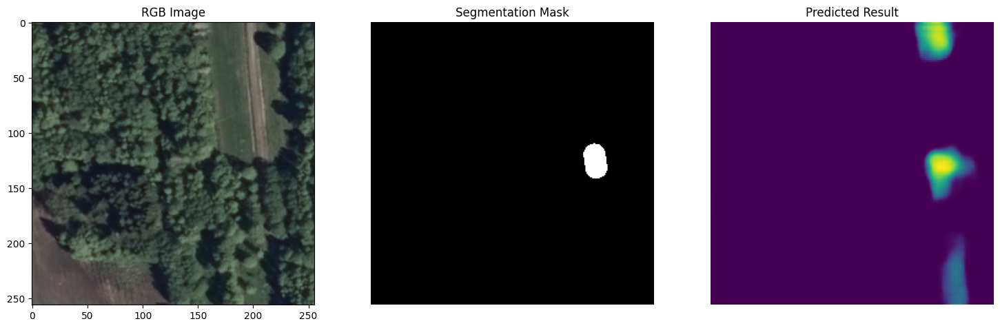

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


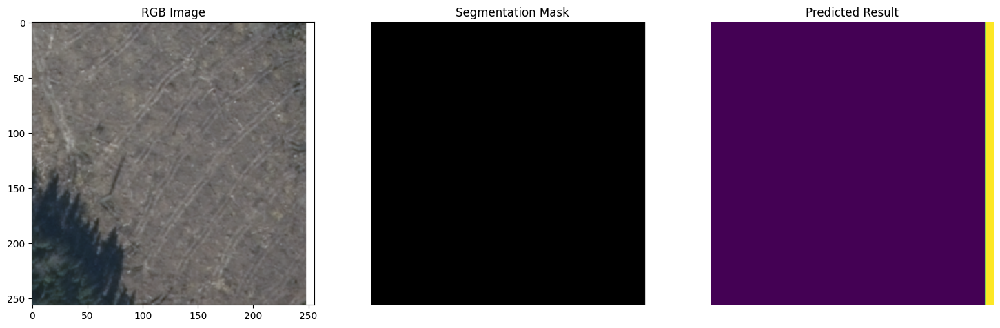

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


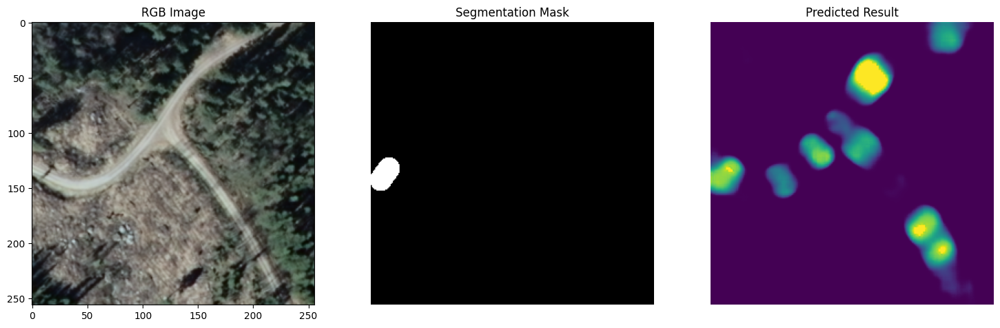

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


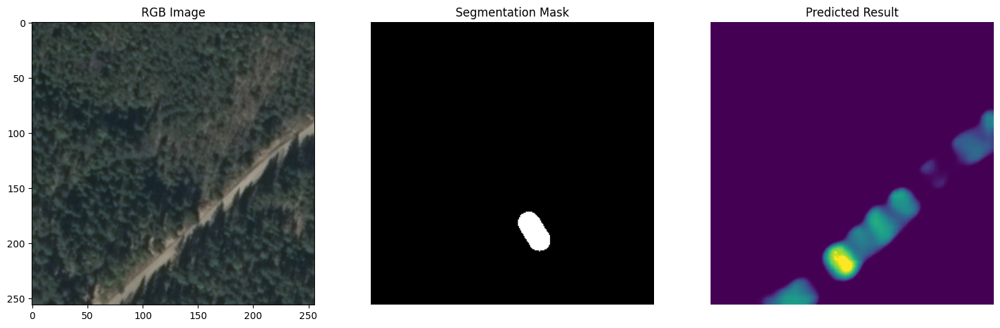

In [15]:
import matplotlib.pyplot as plt

test_batch = next(testing_generator_RGB)

images, labels = test_batch
num_images_to_plot = 4

for i in range(min(num_images_to_plot, images.shape[0])):
    plt.figure(figsize=(18, 6))
    
    # Combine first three channels into an RGB image
    rgb_image = images[i]  # Assuming images are already in RGB format
    
    # Plot RGB image
    plt.subplot(1, 3, 1)
    plt.imshow(rgb_image)
    plt.title('RGB Image')

    # Plot the segmentation mask
    plt.subplot(1, 3, 2)
    plt.imshow(labels[i, :, :, 0], cmap='gray')  # Assuming batch size is 1
    plt.title('Segmentation Mask')
    plt.axis('off')

    # Run prediction
    input_array = tf.image.resize(images[i], [IMG_HEIGHT, IMG_WIDTH])
    input_array = tf.expand_dims(input_array, axis=0)  # Add batch dimension
    predictions = model_rgb.predict(input_array)

    # Plot the predicted result
    plt.subplot(1, 3, 3)
    plt.imshow(predictions[0, :, :, 0], cmap='viridis')
    plt.title('Predicted Result')
    plt.axis('off')
    plt.show()


# RGB + Downslope

In [23]:
import sys
sys.path.insert(1, '/workspace/code/model/')
from data_generator import create_train_generator_combined, create_test_generator_combined

image_dir = '/workspace/trainingData/rgb_downslope_256/training/images'
mask_dir = '/workspace/trainingData/rgb_downslope_256/training/labels'


training_generator_combined = create_train_generator_combined(image_dir, mask_dir)
# test generetor

test_image_dir = '/workspace/trainingData/rgb_downslope_256/testing/images'
test_mask_dir = '/workspace/trainingData/rgb_downslope_256/testing/labels'

testing_generator_combined = create_test_generator_combined(test_image_dir, test_mask_dir)

Found 23122 images belonging to 1 classes.
Found 23122 images belonging to 1 classes.
Found 5251 images belonging to 1 classes.
Found 5251 images belonging to 1 classes.


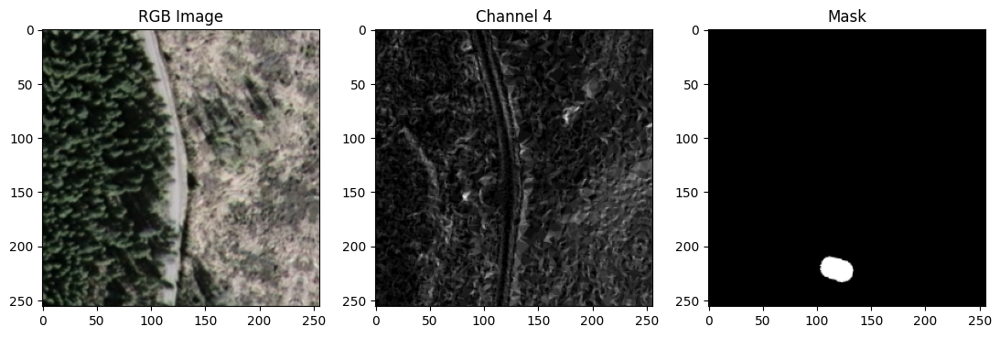

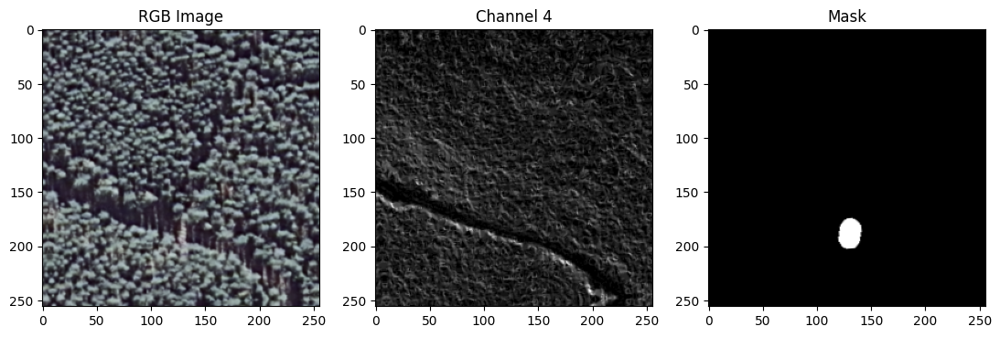

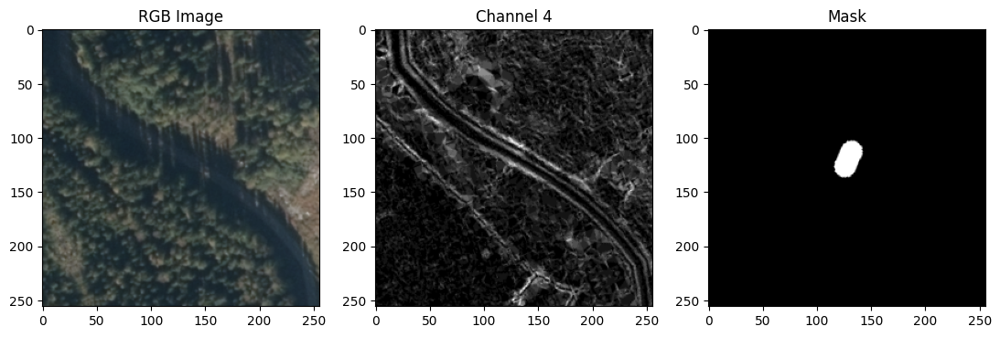

In [24]:
import matplotlib.pyplot as plt
import numpy as np

sample_images, sample_masks = next(training_generator_combined)

# Number of examples to plot
num_examples = 3

for i in range(num_examples):
    plt.figure(figsize=(18, 6))

    # Combine first three channels into an RGB image
    rgb_image = sample_images[i, :, :, :3]

    # Plot RGB image
    plt.subplot(1, 4, 1)
    plt.imshow(rgb_image)
    plt.title('RGB Image')

    # Plot channel 4
    plt.subplot(1, 4, 2)
    plt.imshow(sample_images[i, :, :, 3], cmap='gray')
    plt.title('Channel 4')

    # Plot mask
    plt.subplot(1, 4, 3)
    plt.imshow(sample_masks[i], cmap='gray')
    plt.title('Mask')

    plt.show()


## Train UNET

In [25]:
%%time

from unets import UNet
from metrics import f1_score, MCC, precision_m, recall_m

BATCH_SIZE = 32
IMG_HEIGHT = 256
IMG_WIDTH = 256
IMG_CHANNELS = 4
NUM_CLASSES = 1 

steps = 23122 //BATCH_SIZE # number of training images / batch size
steps_eval = 5251 //BATCH_SIZE # number of testing images / batch size

UNet_model_combined = UNet(IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS, NUM_CLASSES)

UNet_model_combined.compile(tf.keras.optimizers.Adam(learning_rate=0.001), 
    loss=tf.keras.losses.BinaryFocalCrossentropy(
    apply_class_balancing=True,
    alpha=0.97,
    gamma=2.0,
    from_logits=True),
    metrics=[f1_score, MCC, precision_m, recall_m])

checkpoint_filepath = '/workspace/code/saved_models/UNet_combined_bs32_epochs_100.weights.h5'
model_checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
    filepath=checkpoint_filepath,
    save_weights_only=True,
    monitor='val_loss',
    mode='min',
    save_best_only=True)

result_combined = UNet_model_combined.fit(training_generator_combined, epochs=100, validation_data = testing_generator_combined, validation_steps = steps_eval, steps_per_epoch = steps, callbacks = [model_checkpoint_callback, reduce_lr])

Epoch 1/100
722/722 ━━━━━━━━━━━━━━━━━━━━ 496s 663ms/step - f1_score: 0.0363 - loss: 0.0046 - mcc: 0.0510 - precision_m: 0.1485 - recall_m: 0.0251 - val_f1_score: 0.0954 - val_loss: 0.0040 - val_mcc: 0.1519 - val_precision_m: 0.4762 - val_recall_m: 0.0544 - learning_rate: 0.0010
Epoch 2/100
722/722 ━━━━━━━━━━━━━━━━━━━━ 456s 632ms/step - f1_score: 0.1502 - loss: 0.0027 - mcc: 0.1675 - precision_m: 0.2291 - recall_m: 0.1770 - val_f1_score: 0.3613 - val_loss: 0.0021 - val_mcc: 0.3579 - val_precision_m: 0.3318 - val_recall_m: 0.4043 - learning_rate: 0.0010
Epoch 3/100
722/722 ━━━━━━━━━━━━━━━━━━━━ 442s 612ms/step - f1_score: 0.2705 - loss: 0.0025 - mcc: 0.2881 - precision_m: 0.2714 - recall_m: 0.3610 - val_f1_score: 0.4412 - val_loss: 0.0019 - val_mcc: 0.4375 - val_precision_m: 0.4453 - val_recall_m: 0.4435 - learning_rate: 0.0010
Epoch 4/100
722/722 ━━━━━━━━━━━━━━━━━━━━ 450s 624ms/step - f1_score: 0.0016 - loss: 0.0055 - mcc: 0.0015 - precision_m: 0.0053 - recall_m: 0.0027 - val_f1_score: 0

## Evaluate UNet

In [26]:
UNet_model_combined.load_weights(checkpoint_filepath)
UNet_model_combined.evaluate(testing_generator_combined, steps=steps_eval, batch_size=BATCH_SIZE)

164/164 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - f1_score: 0.5385 - loss: 0.0013 - mcc: 0.5430 - precision_m: 0.4603 - recall_m: 0.6551


[0.0013688759645447135,
 0.5362362265586853,
 0.5411105155944824,
 0.45552727580070496,
 0.6573574542999268]

## Train Attention res UNET

In [54]:
%%time

from unets import Attention_ResUNet
from metrics import f1_score, MCC, precision_m, recall_m
# best so far batch size 32 for 50 epochs
BATCH_SIZE = 32
IMG_HEIGHT = 256
IMG_WIDTH = 256
IMG_CHANNELS = 4
NUM_CLASSES = 1 

steps = 23122 //BATCH_SIZE # number of training images / batch size
steps_eval = 5251 //BATCH_SIZE # number of testing images / batch size

model_combined = Attention_ResUNet(IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS, NUM_CLASSES)

model_combined.compile(tf.keras.optimizers.Adam(learning_rate=0.001), 
    loss=tf.keras.losses.BinaryFocalCrossentropy(
    apply_class_balancing=True,
    alpha=0.97,
    gamma=2.0,
    from_logits=True),
    metrics=[f1_score, MCC, precision_m, recall_m])

checkpoint_filepath = '/workspace/code/saved_models/Attention_ResUNet_combined_97_bs_32_epoch_100.weights.h5'
model_checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
    filepath=checkpoint_filepath,
    save_weights_only=True,
    monitor='val_loss',
    mode='min',
    save_best_only=True)

result_combined = model_combined.fit(training_generator_combined, epochs=100, validation_data = testing_generator_combined, validation_steps = steps_eval, steps_per_epoch = steps, callbacks = [model_checkpoint_callback, reduce_lr])

Epoch 1/100
722/722 ━━━━━━━━━━━━━━━━━━━━ 520s 634ms/step - f1_score: 0.1136 - loss: 0.0107 - mcc: 0.1699 - precision_m: 0.0638 - recall_m: 0.5717 - val_f1_score: 0.1167 - val_loss: 0.0098 - val_mcc: 0.2021 - val_precision_m: 0.0631 - val_recall_m: 0.7865 - learning_rate: 0.0010
Epoch 2/100
722/722 ━━━━━━━━━━━━━━━━━━━━ 420s 582ms/step - f1_score: 0.2363 - loss: 0.0086 - mcc: 0.2970 - precision_m: 0.1446 - recall_m: 0.6642 - val_f1_score: 0.2302 - val_loss: 0.0079 - val_mcc: 0.2792 - val_precision_m: 0.1432 - val_recall_m: 0.5970 - learning_rate: 0.0010
Epoch 3/100
722/722 ━━━━━━━━━━━━━━━━━━━━ 419s 580ms/step - f1_score: 0.2875 - loss: 0.0076 - mcc: 0.3330 - precision_m: 0.1871 - recall_m: 0.6328 - val_f1_score: 0.3904 - val_loss: 0.0070 - val_mcc: 0.3981 - val_precision_m: 0.3111 - val_recall_m: 0.5311 - learning_rate: 0.0010
Epoch 4/100
722/722 ━━━━━━━━━━━━━━━━━━━━ 419s 581ms/step - f1_score: 0.3281 - loss: 0.0071 - mcc: 0.3633 - precision_m: 0.2247 - recall_m: 0.6187 - val_f1_score: 0

In [56]:
#model.summary()

# Calculate and print the total number of parameters
total_params = model_combined.count_params()
print("Total number of parameters:", total_params)

Total number of parameters: 39091017


(0.0, 200.0)

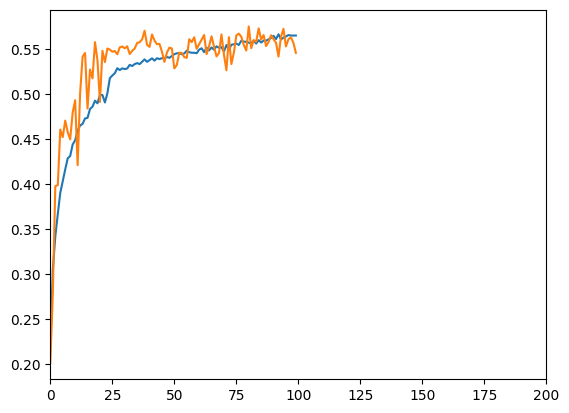

In [84]:
# summarize history for accuracy 32 epochs
import matplotlib.pyplot as plt
plt.plot(result_combined.history['mcc'])
plt.plot(result_combined.history['val_mcc'])
#plt.plot(result_combined.history['loss'])
#plt.plot(result_combined.history['val_loss'])
#plt.title('F1 score')
#plt.ylabel('F1')
#plt.xlabel('epoch')
plt.xlim(0,200)
#plt.show()

## Test the model

In [85]:
#0.97 Wall time: 21h  batch size 32 100 epochs
model_combined.load_weights(checkpoint_filepath)
model_combined.evaluate(testing_generator_combined, steps=steps_eval, batch_size=BATCH_SIZE)

164/164 ━━━━━━━━━━━━━━━━━━━━ 27s 165ms/step - f1_score: 0.5648 - loss: 0.0058 - mcc: 0.5765 - precision_m: 0.4611 - recall_m: 0.7361


[0.005826984997838736,
 0.559050440788269,
 0.5701448321342468,
 0.4565550982952118,
 0.726837694644928]

## Predict

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


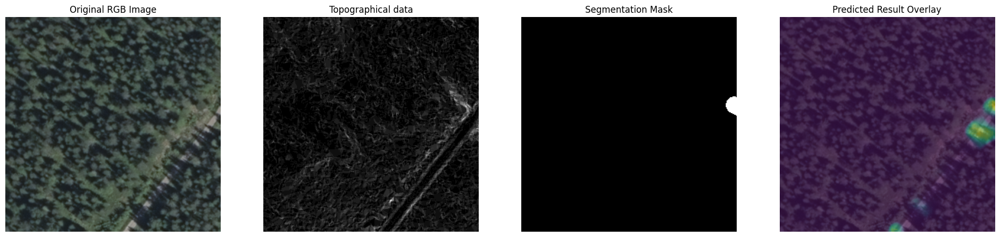

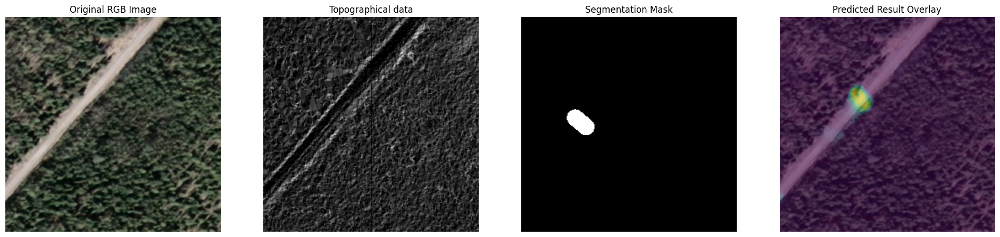

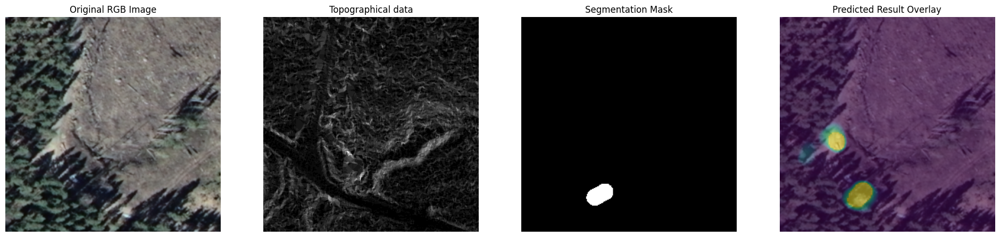

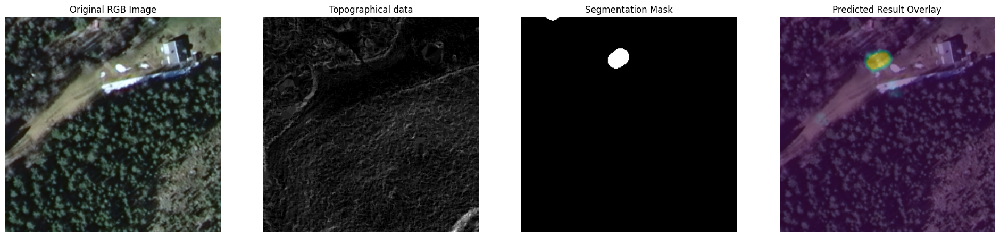

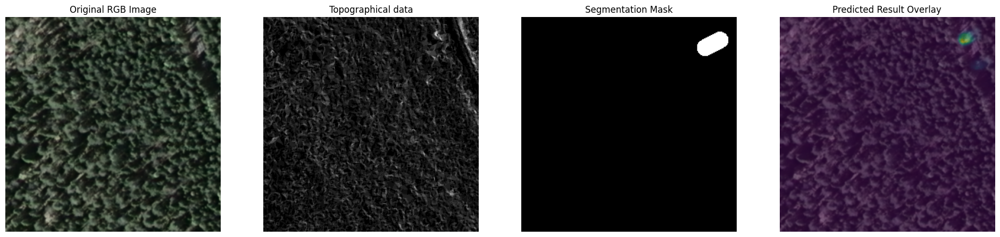

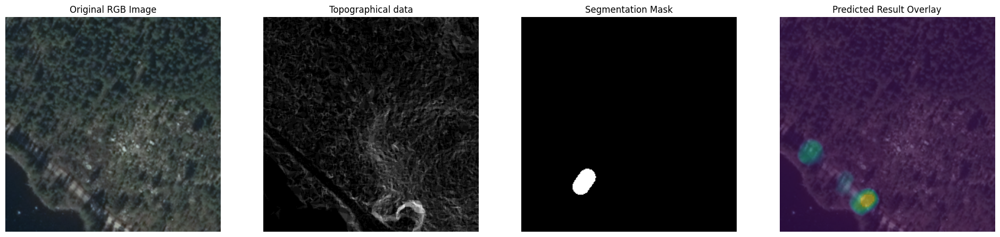

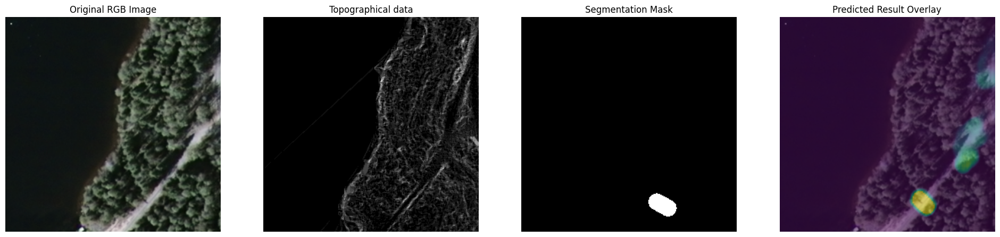

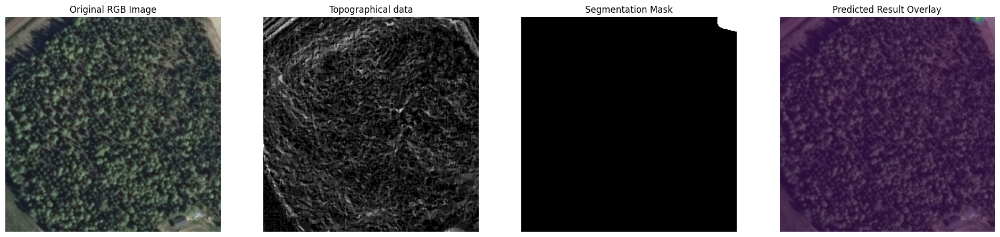

In [49]:
import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf

test_batch = next(testing_generator_combined)

# Extract the first 2 images and labels from the batch
images, labels = test_batch
num_images_to_plot = 8

# Assuming you have a model named 'model'
for i in range(min(num_images_to_plot, images.shape[0])):
    # Preprocess the image
    input_array = tf.image.resize(images[i], [IMG_HEIGHT, IMG_WIDTH])
    input_array = tf.expand_dims(input_array, axis=0)  # Add batch dimension

    # Run prediction
    predictions = model_combined.predict(input_array)
    
    # Calculate probability map from predictions
    probability_map = predictions[0, :, :, 0]

    # Apply threshold of 0.5
    thresholded_map = np.where(probability_map > 0.5, 1, 0)

    plt.figure(figsize=(24, 6))

    # Combine first three channels into an RGB image
    rgb_image = images[i, :, :, :3]
    band4 = images[i, :, :, 3]
    # Plot the original RGB image
    plt.subplot(1, 4, 1)
    plt.imshow(rgb_image, cmap='gray')
    plt.title('Original RGB Image')
    plt.axis('off')

    plt.subplot(1, 4, 2)
    plt.imshow(band4, cmap='gray')
    plt.title('Topographical data')
    plt.axis('off')
    
    # Plot the segmentation mask
    plt.subplot(1, 4, 3)
    plt.imshow(labels[i], cmap='gray')
    plt.title('Segmentation Mask')
    plt.axis('off')

    # Plot the original image with the predicted result as a transparent overlay with a different colormap
    plt.subplot(1, 4, 4)
    plt.imshow(rgb_image)
    plt.imshow(predictions[0, :, :, 0], cmap='viridis', alpha=0.5)  # Change 'viridis' to your desired colormap
    plt.title('Predicted Result Overlay')
    plt.axis('off')


The combined model had the best result